In [22]:
from __future__ import print_function, division

import numpy as np
import matplotlib.pyplot as plt
#import pandas as pd
from notebook_functions import uniformize_source_names, source_column, source_error, plot_magnitudes

from gatspy.periodic import LombScargleFast

%matplotlib inline

from astropy.table import Table, Column

## Set the name of your file in the cell below


In [23]:
aij_raw = Table.read('/Users/erinaadland/Documents/College Work/TrES-3/glowing-waffles-master/updated_measurements_4.csv')

### Get list of soures in the AIJ table

In [24]:
sources = uniformize_source_names(aij_raw)
sources = [r for r in range(1,112)]
print(sources)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111]


## Set EITHER the list of known variables or the list of comparison stars

Do **NOT** set both.

The one you do NOT want to use should be set to `None`

In [25]:
# List of stars you think ARE variable 
known_variables = None  # Change to list of stars in the field that you know vary, or None

# List of stars you think ARE NOT variable
keepers = [6,4,5,7,3] # Change to list of comparisons you want to use, or None

# Check that settings are sensible

if known_variables is None and keepers is None:
    raise ValueError('You must set either known_variables or keepers to a list')

if known_variables is not None and keepers is not None:
    raise ValueError('Only ONE of known_variables and keeps can be set. '
                     'The other should be set to None.')

## Calculate comparison counts, AIJ-style

Which is to say that we calculate the comparison counts as the unweighted sum of the counts of all of the comparison stars, exceluding any known variables from the set.

In [26]:
comp_counts = np.zeros_like(aij_raw[str(1)])
for source in sources:
    if keepers:
        if source not in keepers: 
            # Variables shouldn't be in the comparison set
            continue
    elif known_variables:
        if source in known_variables:
            # Variables shout not be in comparison set
            continue
    #print(source, source_column(source))
    # Add source to comparison counts
    comp_counts += aij_raw[str(source)]

### Now flux ratios for each star

In a new table, I think...

#### Some camera paremeters for calculating SNR

In [27]:
gain = 1.5
read_noise = 30.0

# ~~FIX ERROR CALCULATION~~

In [28]:
npix = np.pi * 10**2  # pixel^2, estimated aperture size
n_sky = 50.0   # counts/pixel, estimated upper limit

#### Hmmm, can't calculate real SNR because we don't know aperture/annulus sizes

So the best we can do, I think, is to estimate the SNR using $SNR \approx \sqrt{gN}$, where $g$ is gain and $N$ is the number of net soure counts in the aperture.

In [29]:
mags = []
mag_err = []
for source in sources:
    mag = -2.5 * np.log10(aij_raw[str(source)] / comp_counts)
    #err = aij_raw[source_error(source)] 
    #snr = gain * aij_raw[source] / err
    #mag_e = 1/snr
    mags.append(mag)
    #mag_err.append(mag_e)

### Find unique date for each night

We need to do this to group the data by night.

In [30]:
night = np.floor(aij_raw['BJD_TDB'] + 0.5) - 1

unique_nights = np.unique(night)

#unique_nights = set(unique_nights) - set((2456411.0, 2456422.0))
unique_nights = sorted(unique_nights)
number_of_nights = len(unique_nights)
print(set(unique_nights))

set([2457510.0, 2457126.0, 2457512.0, 2457259.0, 2457293.0, 2456957.0, 2457072.0, 2457265.0, 2457526.0, 2457239.0, 2455835.0, 2457500.0, 2457245.0])


## Function for making single magnitude plot

In [31]:
brightest_mag = np.nanmin(mags)
print(brightest_mag)

-inf


# ~~STRETCH OUT HORIZONTAL to use full width~~
# MOVE NIGHT INDICATOR??
# ~~SMOOTHED LINE FOR THE NIGHT?~~
# Periodogram/folded curve -- instead added bar showing power...

...the bigger the bar, the more likely there is a periodic signal in the data.

1 0.176047032204
2 0.142637525716
3 0.0913177807458
4 0.0459558734099
5 0.139665463954
6 0.359116067803
7 0.201766737121
8 0.166156603429
9 0.172103371766
10 0.866524534327
11 0.132510522328
12 0.317315284401
13 0.209883551039
14 0.0713903467959
15 0.197927524691
16 0.162082431691
17 0.210146655654
18 0.518617811112
19 0.0813496837396
20 0.307989084541
21 0.247974274978
22 0.20094771907
23 0.0482993088975
24 0.327253125118
25 0.165849726637
26 0.148730341184
27 0.148197333336
28 0.19371906472
29 0.194087546314
30 0.230436295533
31 0.109054234185
32 0.200720951242
33 0.134356876158
34 0.145393054329
36 0.149748133645
37 0.258154451839
38 0.163228313609
39 0.156201783283
40 0.103805477158
41 0.140338804316
42 0.168477336158
43 0.123397682319
44 0.102794076897
45 0.149952436115
46 0.139343357893
47 0.137969432082
48 0.202029347183
49 0.11384420607
50 0.206239083783
51 0.152592365217
52 0.131850167251
53 0.220185680021
54 0.171698093205
55 0.117620642319
56 0.161887508082
57 0.198178638428

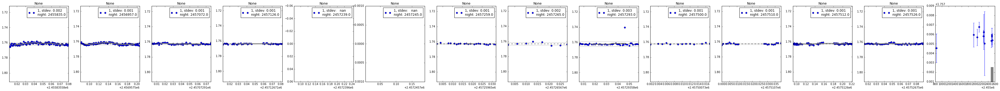

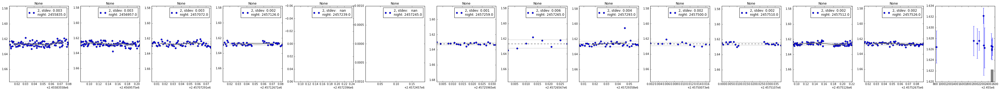

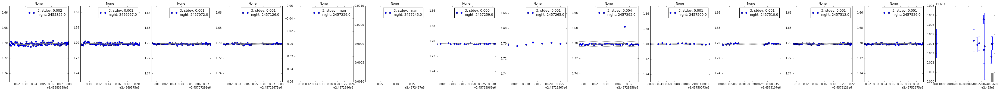

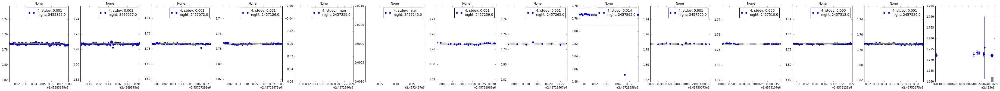

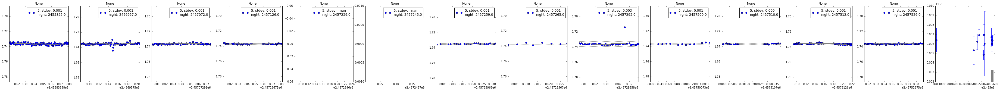

...

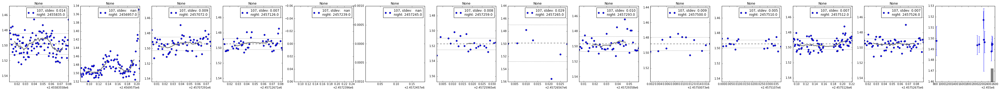

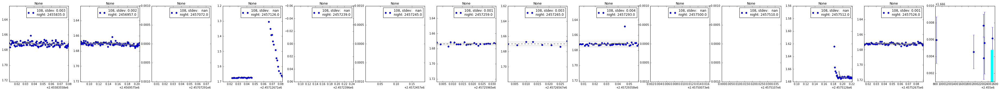

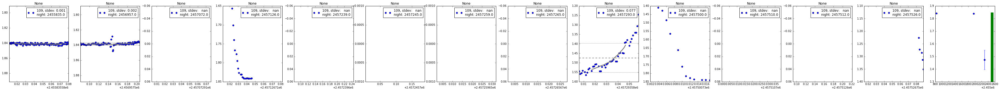

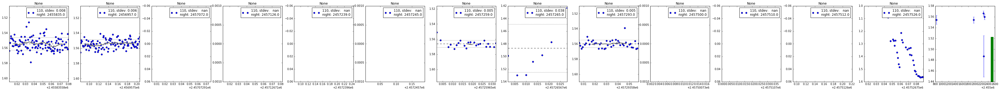

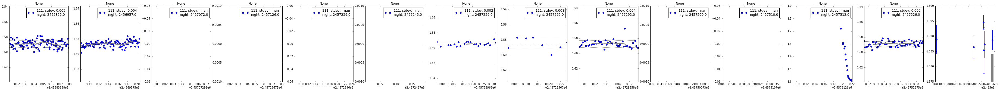

In [32]:
for source in sources:
    if source == 35:
        continue
    plt.figure(figsize=(5 * number_of_nights,5))

    night_means = []
    night_stds = []
    night_bins = []
    for i, this_night in enumerate(unique_nights):
        plt.subplot(1, number_of_nights + 1, i + 1)
        night_mask = (night == this_night)
        night_mean, night_std = plot_magnitudes(mags=mags[source-1][night_mask],
                                                times=aij_raw['BJD_TDB'][night_mask],
                                                source=source, night=this_night,
                                                ref_mag=brightest_mag)
        night_means.append(night_mean)
        night_stds.append(night_std)
        night_bins.append(this_night)
        
    plt.subplot(1, number_of_nights + 1, number_of_nights + 1)
  
    # Plot variation over nights.
    night_means = np.array(night_means)
    plt.errorbar(night_bins, night_means, yerr=night_stds, fmt='o')
    variation = night_means.max() - night_means.min()
    size = 10000*variation
    y_lims = plt.ylim()
    y_range = plt.ylim()[1] - plt.ylim()[0]
    plt.scatter([0.8*(plt.xlim()[1]-plt.xlim()[0]) + plt.xlim()[0]], 
                [0.8*(y_range) + plt.ylim()[0]], 
                c='green', marker='o', s=size)
    
    # Plot bar proportional to Lomb-Scargle power.
    bad_mags = np.isnan(mags[source-1]) | np.isinf(mags[source-1])
    #bad_errs = np.isnan(mag_err[source-1])
    bads = bad_mags #| bad_errs
    good_mags = ~bads
    model = LombScargleFast().fit(aij_raw['BJD_TDB'][good_mags], 
                                  mags[source-1][good_mags])
    periods, power = model.periodogram_auto(nyquist_factor=100, oversampling=20)
    max_pow = power.max()
    print(source, max_pow)
    if max_pow > 0.5:
        color = 'green'
    elif max_pow > 0.4:
        color = 'cyan'
    else:
        color = 'gray'
        
    bar_x = (night_bins[-2] + night_bins[-1])/2
    plt.plot([bar_x, bar_x], [plt.ylim()[0], max_pow * y_range + plt.ylim()[0]], 
             color=color, linewidth=10)
    plt.ylim(*y_lims)
    

In [11]:
err = Column(mag_err[12].data, name='mag_error')

foo = Table([aij_raw['BJD_TDB'], mags[12], err])

NameError: name 'mag_err' is not defined

In [15]:
foo.write('kelt_12.csv')